In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

In [30]:
data = pd.read_csv("diabetes.csv")
data.drop(["DiabetesPedigreeFunction","Outcome","BMI","SkinThickness"], axis='columns')


,Pregnancies,Glucose,BloodPressure,Insulin,Age
0,6,148,72,0,50
1,1,85,66,0,31
2,8,183,64,0,32
3,1,89,66,94,21
4,0,137,40,168,33
...,...,...,...,...,...
763,10,101,76,180,63
764,2,122,70,0,27
765,5,121,72,112,30
766,1,126,60,0,47


In [35]:
X = data[["Glucose", "BloodPressure","Age"]]

In [36]:
# # load the dataset
# data = pd.read_csv("Iris.csv")
# X = data[["SepalLengthCm", "SepalWidthCm","PetalLengthCm","PetalWidthCm"]]
# #X = data[["PetalLengthCm", "PetalWidthCm"]]
# print(X)

In [37]:
scaler = MinMaxScaler()
X = scaler.fit_transform(X)

d:\sw\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


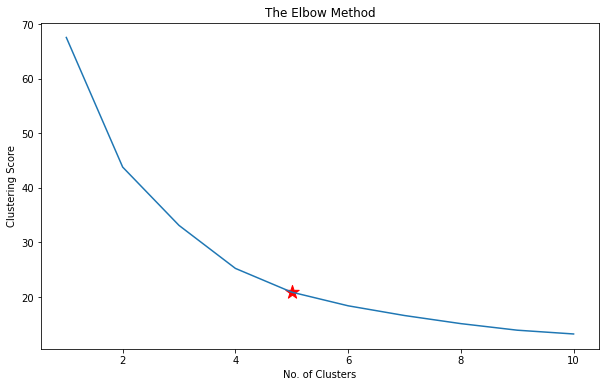

In [96]:
clustering_score = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'random', random_state = 42)
    #kmeans = KMeans(n_clusters=i, init ='k-means++',random_state=0 )
    kmeans.fit(X)
    clustering_score.append(kmeans.inertia_) # inertia_ = Sum of squared distances of samples to their closest cluster center.

plt.figure(figsize=(10,6))
plt.plot(range(1, 11), clustering_score)
plt.scatter(5,clustering_score[4], s = 200, c = 'red', marker='*')
plt.title('The Elbow Method')
plt.xlabel('No. of Clusters')
plt.ylabel('Clustering Score')
plt.show()

In [97]:
# Initialize the K-means model
kmeans = KMeans(n_clusters=5)

# Fit the model to the data
kmeans.fit(X)

KMeans(n_clusters=5)

In [98]:
# # Get the centroids
# centroids = kmeans.cluster_centers_

# # Get the labels for each data point
# labels = kmeans.labels_

# # Create an empty list to store the distances
# distances = []

In [99]:
import numpy as np

def clustering(X, k, maximum_iter=100):

    # Initialize centroids randomly
    centroids = X[np.random.choice(X.shape[0], k, replace=False)]
    for i in range(maximum_iter):
        #  distances between each data point and the centroids
        distances = np.array([np.linalg.norm(X - centroid, axis=1) for centroid in centroids])
        w = 1/distances
        #print(distances)
        
        # s=np.sum(w, axis=0)
        # Normalize
        w = w/np.sum(w, axis=0)
        
        #print(w)
        #  data points --> cluster with the highest weight
        clusters = np.argmax(w, axis=0)

        # Update centroids
        new_centroids = np.array([X[clusters == j].mean(axis=0) for j in range(k)])
        #new_centroids = np.array([np.average(X[clusters == j], axis=0, weights=w[clusters == j]) for j in range(k)])
        # Check 
        if np.all(centroids == new_centroids):
            break
        centroids = new_centroids
    return clusters, centroids

[3 1 4 1 1 1 1 2 3 3 0 4 3 3 3 2 0 1 2 1 1 0 4 1 3 0 3 1 3 0 3 4 1 1 0 1 4
 0 1 3 4 0 0 3 4 4 4 1 1 2 1 1 1 3 4 1 4 0 3 1 2 0 0 1 0 1 0 3 1 4 1 4 0 1
 1 1 0 1 2 1 1 2 0 1 0 1 0 1 0 1 1 0 0 3 4 4 1 1 1 0 4 4 1 1 1 1 0 4 1 1 4
 3 1 1 4 3 0 1 1 1 4 1 1 3 1 2 1 1 0 3 4 1 4 0 1 1 1 1 4 1 3 0 1 0 4 1 0 0
 3 1 4 0 4 4 4 4 1 1 1 3 4 0 1 1 4 0 4 0 1 1 0 4 2 1 1 4 0 4 3 0 0 1 1 1 0
 4 3 0 1 4 1 0 4 2 0 4 1 1 1 4 1 4 1 1 3 1 3 3 1 4 1 4 3 4 0 4 1 1 1 0 4 3
 2 3 1 1 1 4 4 1 4 3 1 1 1 4 3 4 4 1 1 1 1 1 4 3 0 4 0 1 0 4 1 1 0 1 1 1 4
 3 4 2 1 3 0 0 2 1 1 2 0 1 0 1 0 1 1 1 3 1 4 0 0 3 3 3 4 1 1 0 1 1 4 1 3 4
 4 1 0 3 2 4 0 1 4 1 3 1 1 1 0 1 4 1 0 1 1 4 1 3 1 1 0 3 1 4 1 4 1 0 0 1 2
 0 1 4 2 0 4 4 1 0 1 0 3 3 1 2 1 0 1 4 0 1 1 3 1 2 0 4 4 3 3 3 4 1 1 1 1 3
 4 1 1 1 1 3 1 1 4 0 1 1 1 1 1 1 0 0 3 1 0 4 1 0 4 1 0 1 1 4 1 3 4 0 4 1 0
 1 4 4 1 1 4 4 1 4 1 4 1 1 1 1 1 1 4 4 2 4 4 0 2 0 1 4 0 2 0 4 1 0 4 1 1 0
 1 4 1 1 1 1 1 1 1 2 1 4 3 1 3 3 0 1 0 0 0 1 1 1 2 4 4 1 1 3 1 3 1 1 0 3 4
 1 1 1 2 1 1 3 1 3 1 0 1 

C:\Users\kunja\AppData\Local\Temp\ipykernel_24728\1414274285.py:10: RuntimeWarning: divide by zero encountered in true_divide
  w = 1/distances
C:\Users\kunja\AppData\Local\Temp\ipykernel_24728\1414274285.py:15: RuntimeWarning: invalid value encountered in true_divide
  w = w/np.sum(w, axis=0)


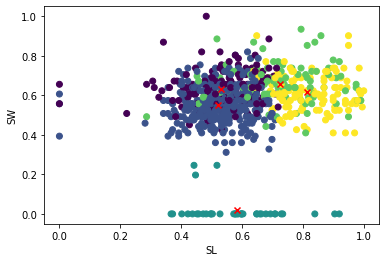

In [100]:
# Define the number of clusters
k = 5

# Run the clustering function
clusters, centroids = clustering(X, k)

# Print the cluster assignments
print(clusters)

# Print the final centroids
print(centroids)

# Plot the data points and the centroids
plt.scatter(X[:, 0], X[:, 1], c=clusters)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x')
plt.xlabel("SL")
plt.ylabel("SW")
plt.show()

In [101]:
# Get the labels for each data point
labels = kmeans.labels_

# Create an empty list to store the distances
distances = []

In [102]:
print(centroids)

[[0.53151173 0.63279827 0.31412037]
 [0.52175548 0.55060371 0.06422156]
 [0.58225337 0.01811907 0.15657895]
 [0.72361809 0.65745511 0.57015873]
 [0.81254097 0.61653599 0.15531401]]


In [103]:
#for comparison
centroids1 = kmeans.cluster_centers_
print(centroids1)

[[0.8094729  0.6179514  0.15508274]
 [0.5275725  0.63489767 0.29444444]
 [0.52071081 0.54450018 0.0597266 ]
 [0.58225337 0.01811907 0.15657895]
 [0.71813614 0.65692996 0.56484848]]


In [104]:
# centroids = np.random.rand(k, X.shape[1])

# # initialize weights as an empty array
# weights = np.zeros((X.shape[0], k))

In [105]:
# # calculate the distance between each data point and the centroids
# for i in range(20):
#     distances = np.linalg.norm(X[i] - centroids[labels[i]])

#     # assign each data point to the closest centroid
#     clusters = np.argmin(distances, axis=1)

#     # calculate the reciprocal of the distance between each data point and the centroid of the cluster
#     for j in range(k):
#         weights[clusters == j, j] = 1 / distances[clusters == j, j]

#     # calculate the weighted average of the data points in each cluster to update the centroids
#     for j in range(k):
#         if np.sum(weights[clusters == j, j]) != 0:
#             centroids[j] = np.average(X[clusters == j], axis=0, weights=weights[clusters == j, j])

In [106]:
# Calculate the distance between each data point and the centroid
for i in range(len(X)):
    distances.append(np.linalg.norm(X[i]-centroids[labels[i]]))

# Calculate the weights for each data point
weights = [1/dist for dist in distances]

# Fit the weighted K-means model
kmeans.fit(X, sample_weight=weights)

KMeans(n_clusters=5)

In [107]:
# Get the new centroids
##
# new_centroids = kmeans.cluster_centers_

new_clusters, new_centroids = clustering(X, k)
# Get the new labels for each data point
new_labels = kmeans.labels_

C:\Users\kunja\AppData\Local\Temp\ipykernel_24728\1414274285.py:10: RuntimeWarning: divide by zero encountered in true_divide
  w = 1/distances
C:\Users\kunja\AppData\Local\Temp\ipykernel_24728\1414274285.py:15: RuntimeWarning: invalid value encountered in true_divide
  w = w/np.sum(w, axis=0)


In [108]:
# centroids = np.random.rand(k, X.shape[1])

# # initialize weights as an empty array
# weights = np.zeros((X.shape[0], k))

In [109]:
# for i in range(20):
#     # calculate the distance between each data point and the centroids
#     distances = np.linalg.norm(X[i] - centroids, axis=2)

#     # assign each data point to the closest centroid
#     clusters = np.argmin(distances, axis=1)

#     # calculate the reciprocal of the distance between each data point and the centroid of the cluster
#     for j in range(k):
#         weights[clusters == j, j] = 1 / distances[clusters == j, j]

#     # calculate the weighted average of the data points in each cluster to update the centroids
#     for j in range(k):
#         if np.sum(weights[clusters == j, j]) != 0:
#             centroids[j] = np.average(X[clusters == j], axis=0, weights=weights[clusters == j, j])

In [110]:
print(new_centroids)

[[0.85472362 0.6045082  0.171     ]
 [0.65766332 0.64507265 0.49337121]
 [0.47256043 0.52818635 0.0812253 ]
 [0.61528999 0.63294057 0.12239583]
 [0.58225337 0.01811907 0.15657895]]


In [111]:
new_centroids1 = kmeans.cluster_centers_
print(new_centroids1)

[[0.52666919 0.62600531 0.2620885 ]
 [0.78570148 0.62522643 0.16018378]
 [0.58725742 0.02129575 0.16655804]
 [0.72155732 0.65554867 0.51304892]
 [0.52203464 0.52619069 0.05742717]]


In [112]:
# Calculate the new distances
new_distances = []
for i in range(len(X)):
    new_distances.append(np.linalg.norm(X[i]-new_centroids[new_labels[i]]))
# Find the data point with the maximum distance
max_dist = max(new_distances)

# Set lambda value
lambda_val = 0.002


In [113]:
# Identify the clusters within the radius of range of max distance - lambda value
clusters_in_range = []
for i in range(len(X)):
    if new_distances[i] <= max_dist - lambda_val:
        clusters_in_range.append(X[i])
        print(clusters_in_range)

[array([0.74371859, 0.59016393, 0.48333333])]
[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667])]
[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333])]
[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ])]
[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ])]
[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ])]
[array([0.74371859, 0.59016393, 0.48333333]), arr

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

[array([0.74371859, 0.59016393, 0.48333333]), array([0.42713568, 0.54098361, 0.16666667]), array([0.91959799, 0.52459016, 0.18333333]), array([0.44723618, 0.54098361, 0.        ]), array([0.68844221, 0.32786885, 0.2       ]), array([0.58291457, 0.60655738, 0.15      ]), array([0.3919598 , 0.40983607, 0.08333333]), array([0.57788945, 0.        , 0.13333333]), array([0.98994975, 0.57377049, 0.53333333]), array([0.6281407 , 0.78688525, 0.55      ]), array([0.55276382, 0.75409836, 0.15      ]), array([0.84422111, 0.60655738, 0.21666667]), array([0.69849246, 0.6557377 , 0.6       ]), array([0.94974874, 0.49180328, 0.63333333]), array([0.83417085, 0.59016393, 0.5       ]), array([0.50251256, 0.        , 0.18333333]), array([0.59296482, 0.68852459, 0.16666667]), array([0.53768844, 0.60655738, 0.16666667]), array([0.51758794, 0.24590164, 0.2       ]), array([0.57788945, 0.57377049, 0.18333333]), array([0.63316583, 0.72131148, 0.1       ]), array([0.49748744, 0.68852459, 0.48333333]), array([0.

In [114]:
# Fit the K-means model to the clusters within the range
final_kmeans = KMeans(n_clusters=5)
final_kmeans.fit(clusters_in_range)

# Get the final labels
final_labels = final_kmeans.labels_
final_labels = final_kmeans.labels_.tolist()

print(final_labels)


[4, 2, 0, 2, 2, 2, 2, 3, 4, 4, 1, 0, 4, 4, 4, 3, 1, 2, 3, 2, 2, 1, 0, 2, 4, 1, 4, 2, 4, 1, 4, 0, 2, 2, 1, 2, 0, 1, 2, 4, 0, 1, 1, 4, 0, 0, 0, 2, 2, 3, 2, 2, 2, 4, 0, 2, 0, 1, 4, 2, 3, 1, 1, 2, 1, 1, 1, 4, 2, 0, 2, 0, 1, 2, 2, 2, 1, 2, 3, 2, 2, 3, 1, 2, 1, 2, 1, 2, 1, 2, 2, 1, 1, 4, 0, 0, 2, 2, 2, 1, 0, 0, 2, 2, 2, 2, 1, 0, 2, 2, 0, 4, 2, 2, 0, 4, 1, 2, 2, 2, 0, 2, 2, 4, 2, 3, 2, 2, 1, 4, 0, 2, 0, 1, 2, 2, 2, 2, 0, 2, 4, 1, 2, 1, 0, 2, 1, 1, 4, 2, 0, 1, 0, 0, 0, 0, 2, 2, 2, 4, 0, 1, 2, 2, 0, 1, 0, 1, 2, 1, 1, 0, 3, 2, 2, 0, 1, 0, 4, 1, 1, 2, 2, 2, 1, 0, 4, 1, 2, 0, 2, 1, 0, 3, 1, 0, 2, 2, 2, 0, 2, 0, 2, 2, 4, 2, 4, 4, 2, 0, 2, 0, 4, 0, 1, 0, 2, 2, 1, 1, 0, 4, 3, 4, 2, 2, 2, 0, 0, 2, 0, 4, 2, 2, 2, 0, 4, 0, 0, 2, 2, 2, 2, 2, 0, 4, 1, 0, 1, 2, 1, 0, 2, 2, 1, 2, 2, 2, 0, 4, 0, 3, 2, 4, 1, 1, 3, 2, 2, 3, 1, 2, 1, 2, 4, 2, 2, 2, 4, 2, 0, 1, 1, 4, 4, 4, 0, 2, 2, 1, 2, 2, 0, 2, 4, 0, 0, 2, 1, 4, 3, 0, 1, 1, 0, 2, 4, 2, 2, 2, 1, 2, 0, 2, 1, 2, 2, 0, 2, 4, 2, 2, 1, 4, 2, 0, 2, 0, 2, 1, 1, 2, 3, 

In [115]:
final_labels = final_kmeans.labels_
X = X[np.where(final_labels != -1)[0]]
final_labels = final_labels[np.where(final_labels != -1)[0]]


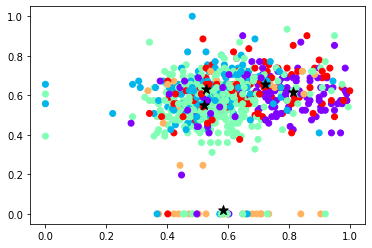

In [116]:
# Plot the clusters
plt.scatter(X[:,0], X[:,1], c=final_labels, cmap='rainbow')
plt.scatter(final_kmeans.cluster_centers_[:, 0], final_kmeans.cluster_centers_[:, 1], color='black', marker='*', s=100)
plt.show()

In [117]:
accuracy = sum([1 for i in range(len(X)) if labels[i] == final_labels[i]]) / len(X)
print(accuracy)

0.7031662269129287


In [118]:
# # Calculate the accuracy
# accuracy = len(np.where(labels == final_labels)) / len(X)
# print(accuracy)

In [119]:

from sklearn.metrics import silhouette_score

score = silhouette_score(X, final_labels)
print("Silhouette Score:", score)

Silhouette Score: 0.04575135746707874
